# Mask R-CNN - Inspect Glomerulus Trained Model

Code and visualizations to test, debug, and evaluate the Mask R-CNN model.

In [1]:
import os
import sys
import random
import math
import re
import time
import numpy as np
import tensorflow as tf
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import pandas as pd

tf.compat.v1.set_random_seed(42)
np.random.seed(42)

# Root directory of the project
ROOT_DIR = os.path.abspath("../")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn import utils
from mrcnn import visualize
from mrcnn.visualize import display_images
import mrcnn.model as modellib
from mrcnn.model import log

sys.path.append(ROOT_DIR+'/Code') ## ADDED BY FRED ORU
import glomerulus

%matplotlib inline 

# Directory to save logs and trained model
LOGS_DIR = os.path.join(ROOT_DIR, "logs")

Using TensorFlow backend.


In [2]:
# Comment out to reload imported modules if they change
%load_ext autoreload
%autoreload 2

## Configurations

In [3]:
# Dataset directory
DATASET_DIR = os.path.abspath("/home/Fred/Data/glomerulus/")

# Inference Configuration
config = glomerulus.GlomerulusInferenceConfig()
config.display()


Configurations:
BACKBONE                       resnet50
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        400
DETECTION_MIN_CONFIDENCE       0
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  1024
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              pad64
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE            

## Notebook Preferences

In [4]:
# Device to load the neural network on.
# Useful if you're training a model on the same 
# machine, in which case use CPU and leave the
# GPU for training.
DEVICE = "/gpu:0"  # /cpu:0 or /gpu:0

# Inspect the model in training or inference modes
# values: 'inference' or 'training'
# Only inference mode is supported right now
TEST_MODE = "inference"

In [5]:
def get_ax(rows=1, cols=1, size=16):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Adjust the size attribute to control how big to render images
    """
    fig, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    fig.tight_layout()
    return ax

## Load Model

In [6]:
# Create model in inference mode
with tf.device(DEVICE):
    model = modellib.MaskRCNN(mode="inference",
                              model_dir=LOGS_DIR,
                              config=config)






Instructions for updating:
keep_dims is deprecated, use keepdims instead
Instructions for updating:
keep_dims is deprecated, use keepdims instead

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Instructions for updating:
box_ind is deprecated, use box_indices instead


Instructions for updating:
Use `tf.cast` instead.


In [7]:
# Path to a specific weights file
# weights_path = os.path.join(LOGS_DIR,"folder/model.h5")

# Or, load the last model you trained
weights_path = model.find_last()

# Load weights
print("Loading weights ", weights_path)
model.load_weights(weights_path, by_name=True)

Loading weights  /home/jupyter/Segmenting-Histology-Images/logs/glomerulus20200603T0624/mask_rcnn_glomerulus_0050.h5






Re-starting from epoch 50


## Load Validation Dataset

## Run Detection and measure Performance

### Measure Performance on Batch of Images

In [28]:
def measure_performance(dataset, image_ids, verbose=1):
    df_perf=pd.DataFrame(columns = ['Id','ImgName','#glomerulus','#undetected','#FP','mIou','mAP'])
    APs = []
    Ious = []
    glomerulus_count = 0
    undetected_count = 0
    false_pos_count = 0

    for image_id in image_ids:

        # Load image
        image, image_meta, gt_class_id, gt_bbox, gt_mask =\
            modellib.load_image_gt(dataset, config,
                                   image_id, use_mini_mask=False)
        
        # Run object detection
        results = model.detect_molded(image[np.newaxis], image_meta[np.newaxis], verbose=0)
        r = results[0]
        
        # Compute Mean Average Precision
        ap = utils.compute_ap_range(
            gt_bbox, gt_class_id, gt_mask,
            r['rois'], r['class_ids'], r['scores'], r['masks'],
            verbose=0)
        APs.append(ap)
        
        # Compute IoUs and Confusion Matrix
        mask_overlaps = utils.compute_overlaps_masks(r['masks'],gt_mask)
        mask_ious = np.amax(mask_overlaps,axis=1) # % of intersection between mask and its ground truth, if nay
        gt_ious = np.amax(mask_overlaps,axis=0) # % of intersection between ground truth and corresponding mask, if any
        undetected = len(gt_ious[gt_ious == 0]) # undetected glomerulus (gt with 0 intersection across detected masks)
        false_pos = len(mask_ious[mask_ious == 0]) # false positive (masks with 0 intersection across ground truth)
        Ious.append(mask_ious)
        glomerulus_count += gt_mask.shape[2] # number of glomerulus in ground truth
        undetected_count += undetected
        false_pos_count += false_pos
        
        df_perf.loc[len(df_perf)]=[
            image_id, 
            dataset.image_info[image_id]['id'], 
            gt_mask.shape[2],
            undetected,
            false_pos, 
            ap,
            mask_ious[mask_ious !=0].mean()
        ]
        
        if verbose:
            info = dataset.image_info[image_id]
            meta = modellib.parse_image_meta(image_meta[np.newaxis,...])
            print("Id n°{:3} -> {}  #gloremuli:{:2}   #undetected :{:2}   #FP:{:2}  mIou on TP:{:.2f}   AP:{:.2f}".format(
                meta["image_id"][0],dataset.image_info[meta["image_id"][0]]['id'],gt_mask.shape[2],undetected,false_pos, mask_ious[mask_ious !=0].mean(), ap))
    
    if verbose: 
        print("\nSummary :")
        print("   #images: {}   #glomeruli: {}   #undetected : {} ({:.2f}%)   #false positive : {} ({:.2f}%) ".format(
            len(image_ids),glomerulus_count,
            undetected_count, undetected_count/glomerulus_count*100,
            false_pos_count, false_pos_count/glomerulus_count*100)
        )
        print("   Mean IoU on True Positive: {:.4f}".format(Ious[Ious !=0].mean()))
        print("   Mean AP : {:.4f}".format(np.mean(APs)))
    
    Ious=pd.DataFrame(Ious)
    df_perf = pd.concat([df_perf, Ious], axis=1)
    return df_perf

In [13]:
def perf_over_dataset(subset,limit):
    dataset = glomerulus.GlomerulusDataset()
    dataset.load_glomerulus(DATASET_DIR, subset)
    dataset.prepare()
    print('-------------')
    print(subset.upper()+' DATASET')
    print('-------------')
    train_perf = measure_performance(dataset, dataset.image_ids[:limit])
    return dataset,train_perf

In [14]:
# Run performance measure on train set
dataset, train_perf = perf_over_dataset('train',1000)

-------------
TRAIN DATASET
-------------

Id n°  0 -> R57 RD VEGF_15.0xC7  #gloremuli: 7   #undetected : 0   #FP: 1  mIou on TP:0.84   AP:0.71
Id n°  1 -> R44 RD PAS_20.0xC6  #gloremuli: 6   #undetected : 0   #FP: 0  mIou on TP:0.84   AP:0.74
Id n°  2 -> R35 RD PAS_20.0xC9  #gloremuli: 4   #undetected : 0   #FP: 0  mIou on TP:0.92   AP:0.88
Id n°  3 -> R25 RD IgG_15.0xC5  #gloremuli: 9   #undetected : 0   #FP: 0  mIou on TP:0.79   AP:0.61
Id n°  4 -> R54 RD IgG_15.0xC1  #gloremuli: 6   #undetected : 0   #FP: 2  mIou on TP:0.87   AP:0.78
Id n°  5 -> R41 RD IgG_15.0xc4  #gloremuli: 7   #undetected : 0   #FP: 1  mIou on TP:0.80   AP:0.61
Id n°  6 -> R22 VEGF 2_15.0xC5  #gloremuli: 9   #undetected : 0   #FP: 0  mIou on TP:0.83   AP:0.69
Id n°  7 -> R53 RD IgG_15.0xC7  #gloremuli: 7   #undetected : 0   #FP: 0  mIou on TP:0.88   AP:0.79
Id n°  8 -> R42 RD PAS_20.0xC1  #gloremuli: 6   #undetected : 0   #FP: 1  mIou on TP:0.89   AP:0.82
Id n°  9 -> R51 RD PAS_20.0xC2  #gloremuli: 5   #undetec

In [38]:
# Run performance measure on val set
dataset, val_perf = perf_over_dataset('val',100)

-------------
VAL DATASET
-------------
Id n°  0 -> R56 RD VEGF_15.0xC1  #gloremuli: 6   #undetected : 0   #FP: 1  mIou on TP:0.86   AP:0.74
Id n°  1 -> R56 RD IgG_15.0xC2  #gloremuli: 8   #undetected : 0   #FP: 1  mIou on TP:0.82   AP:0.65
Id n°  2 -> R33 RD PAS_20.0xC7  #gloremuli: 4   #undetected : 1   #FP: 0  mIou on TP:0.85   AP:0.57
Id n°  3 -> R33 RD PAS_20.0xC8  #gloremuli: 7   #undetected : 1   #FP: 0  mIou on TP:0.85   AP:0.63
Id n°  4 -> R33 RD PAS_20.0xC9  #gloremuli: 5   #undetected : 0   #FP: 0  mIou on TP:0.87   AP:0.77
Id n°  5 -> R24 VEGF_15.0xC5  #gloremuli: 6   #undetected : 0   #FP: 0  mIou on TP:0.84   AP:0.72
Id n°  6 -> R33 RD PAS_20.0xC4  #gloremuli: 5   #undetected : 0   #FP: 1  mIou on TP:0.87   AP:0.78
Id n°  7 -> R21RD PAS_20.0xC3  #gloremuli: 4   #undetected : 0   #FP: 0  mIou on TP:0.87   AP:0.78
Id n°  8 -> R24 VEGF_15.0xC3  #gloremuli: 5   #undetected : 0   #FP: 1  mIou on TP:0.84   AP:0.67
Id n°  9 -> R56 RD VEGF_15.0xC5  #gloremuli: 6   #undetected : 0

In [40]:
# Run performance measure on test set
dataset, test_perf = perf_over_dataset('test',100)

-------------
TEST DATASET
-------------
Id n°  0 -> R34 RD VEGF_15.0xC5  #gloremuli:10   #undetected : 0   #FP: 0  mIou on TP:0.80   AP:0.63
Id n°  1 -> R39 RD VEGF_15.0xC2  #gloremuli: 5   #undetected : 0   #FP: 0  mIou on TP:0.88   AP:0.82
Id n°  2 -> R52 RD VEGF_15.0xC6  #gloremuli: 8   #undetected : 0   #FP: 1  mIou on TP:0.86   AP:0.74
Id n°  3 -> R34 RD VEGF_15.0xC3  #gloremuli: 8   #undetected : 0   #FP: 1  mIou on TP:0.81   AP:0.64
Id n°  4 -> R52 RD VEGF_15.0xC2  #gloremuli:11   #undetected : 0   #FP: 1  mIou on TP:0.84   AP:0.73
Id n°  5 -> R58 RD PAS_20.0xC1  #gloremuli: 5   #undetected : 0   #FP: 0  mIou on TP:0.89   AP:0.82
Id n°  6 -> R34 RD VEGF_15.0xC1  #gloremuli: 6   #undetected : 0   #FP: 0  mIou on TP:0.85   AP:0.72
Id n°  7 -> R58 RD PAS_20.0xC5  #gloremuli: 6   #undetected : 0   #FP: 0  mIou on TP:0.85   AP:0.74
Id n°  8 -> R34 RD PAS_20.0xC8  #gloremuli: 5   #undetected : 0   #FP: 0  mIou on TP:0.91   AP:0.85
Id n°  9 -> R52 RD IgG_15.0xC6  #gloremuli: 8   #unde

### Measure Performance on just one image and visualize

image ID: glomerulus.R52 RD PAS_20.0xC2 (20) R52 RD PAS_20.0xC2
Original image shape:  [1018 1920    3]
----------------------
Mean Average Precision
----------------------
AP @0.50:	 1.000
AP @0.55:	 1.000
AP @0.60:	 1.000
AP @0.65:	 1.000
AP @0.70:	 1.000
AP @0.75:	 1.000
AP @0.80:	 1.000
AP @0.85:	 0.640
AP @0.90:	 0.000
AP @0.95:	 0.000
AP @0.50-0.95:	 0.764
-----------------------------
Masks Intersection over Union
-----------------------------
Number of Glomerulus :  5
Number of Undetected     :  0
Number of False Positive :  1
Mean IoU on True Positives : 0.86


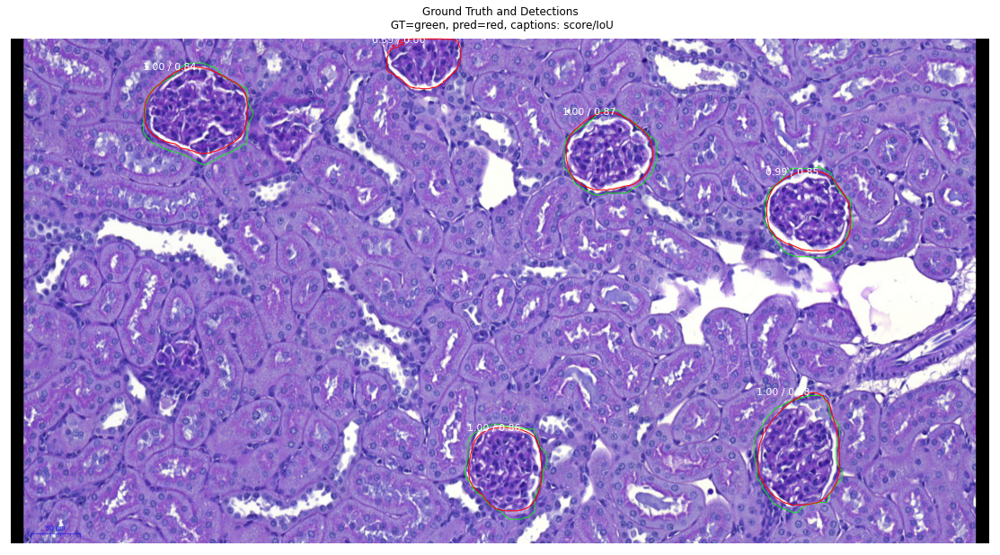

In [45]:
# Set image id
#image_id = random.choice(dataset.image_ids)
# or 
image_id = 20

# Set dataset
# subset = 'train'
# dataset = glomerulus.GlomerulusDataset()
# dataset.load_glomerulus(DATASET_DIR, subset)
# dataset.prepare()
# print('-------------')
# print(subset.upper()+' DATASET')
# print('-------------')


# get ground truth information
image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)

info = dataset.image_info[image_id]
print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                       dataset.image_reference(image_id)))
print("Original image shape: ", modellib.parse_image_meta(image_meta[np.newaxis,...])["original_image_shape"][0])

# Run object detection
results = model.detect_molded(np.expand_dims(image, 0), np.expand_dims(image_meta, 0), verbose=0)
r = results[0]

# Compute AP over range 0.5 to 0.95 and print it
print("----------------------")
print("Mean Average Precision")
print("----------------------")
utils.compute_ap_range(gt_bbox, gt_class_id, gt_mask,
                       r['rois'], r['class_ids'], r['scores'], r['masks'],
                       verbose=1)
# Compute Masks IoU
print("-----------------------------")
print("Masks Intersection over Union")
print("-----------------------------")
mask_overlaps = utils.compute_overlaps_masks(r['masks'],gt_mask)
mask_ious = np.amax(mask_overlaps,axis=1)
gt_ious = np.amax(mask_overlaps,axis=0)
print('Number of Glomerulus : ',gt_mask.shape[2])
print('Number of Undetected     : ',len(gt_ious[gt_ious == 0])) 
print('Number of False Positive : ',len(mask_ious[mask_ious == 0])) 
print('Mean IoU on True Positives : {:.2f}'.format(mask_ious[mask_ious !=0].mean()))

visualize.display_differences(
    image,
    gt_bbox, gt_class_id, gt_mask,
    r['rois'], r['class_ids'], r['scores'], r['masks'],
    dataset.class_names, ax=get_ax(),
    show_box=False, show_mask=False,
    iou_threshold=0.5, score_threshold=0.5)

# Display predictions only
# visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
#                             dataset.class_names, r['scores'], ax=get_ax(1),
#                             show_bbox=False, show_mask=False,
#                             title="Predictions")

# Display Ground Truth only
# visualize.display_instances(image, gt_bbox, gt_mask, gt_class_id, 
#                             dataset.class_names, ax=get_ax(1),
#                             show_bbox=False, show_mask=False,
#                             title="Ground Truth")

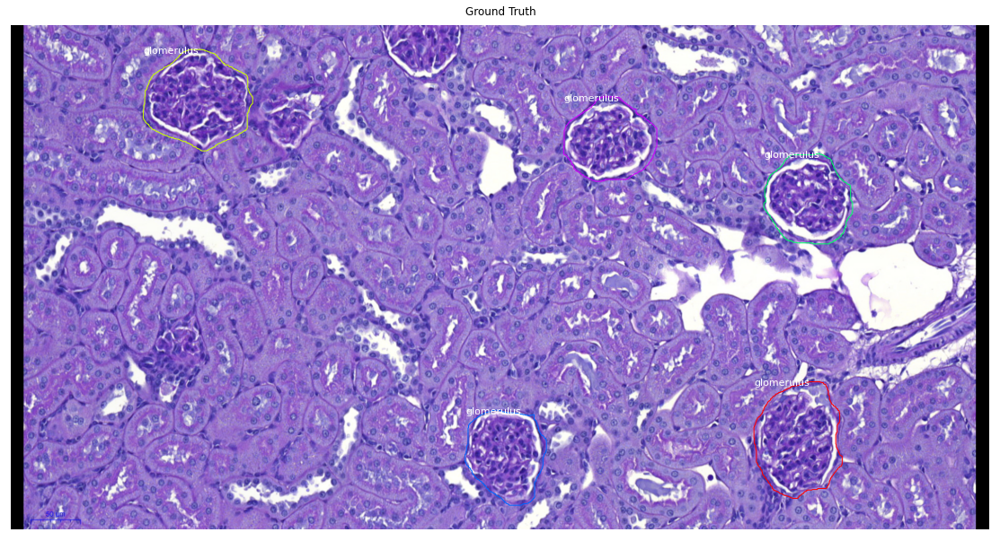

In [46]:
# Display predictions only
# visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
#                             dataset.class_names, r['scores'], ax=get_ax(1),
#                             show_bbox=False, show_mask=False,
#                             title="Predictions")

# Display Ground Truth only
visualize.display_instances(image, gt_bbox, gt_mask, gt_class_id, 
                            dataset.class_names, ax=get_ax(1),
                            show_bbox=False, show_mask=False,
                            title="Ground Truth")

## Step by Step Prediction

## Stage 1: Region Proposal Network

The Region Proposal Network (RPN) runs a lightweight binary classifier on a lot of boxes (anchors) over the image and returns object/no-object scores. Anchors with high *objectness* score (positive anchors) are passed to the stage two to be classified.

Often, even positive anchors don't cover objects fully. So the RPN also regresses a refinement (a delta in location and size) to be applied to the anchors to shift it and resize it a bit to the correct boundaries of the object.

### 1.a RPN Targets

The RPN targets are the training values for the RPN. To generate the targets, we start with a grid of anchors that cover the full image at different scales, and then we compute the IoU of the anchors with ground truth object. Positive anchors are those that have an IoU >= 0.7 with any ground truth object, and negative anchors are those that don't cover any object by more than 0.3 IoU. Anchors in between (i.e. cover an object by IoU >= 0.3 but < 0.7) are considered neutral and excluded from training.

To train the RPN regressor, we also compute the shift and resizing needed to make the anchor cover the ground truth object completely.

In [24]:
# Get anchors and convert to pixel coordinates
anchors = model.get_anchors(image.shape)
anchors = utils.denorm_boxes(anchors, image.shape[:2])
log("anchors", anchors)

# Generate RPN trainig targets
# target_rpn_match is 1 for positive anchors, -1 for negative anchors
# and 0 for neutral anchors.
target_rpn_match, target_rpn_bbox = modellib.build_rpn_targets(
    image.shape, anchors, gt_class_id, gt_bbox, model.config)
log("target_rpn_match", target_rpn_match)
log("target_rpn_bbox", target_rpn_bbox)

positive_anchor_ix = np.where(target_rpn_match[:] == 1)[0]
negative_anchor_ix = np.where(target_rpn_match[:] == -1)[0]
neutral_anchor_ix = np.where(target_rpn_match[:] == 0)[0]
positive_anchors = anchors[positive_anchor_ix]
negative_anchors = anchors[negative_anchor_ix]
neutral_anchors = anchors[neutral_anchor_ix]
log("positive_anchors", positive_anchors)
log("negative_anchors", negative_anchors)
log("neutral anchors", neutral_anchors)

# Apply refinement deltas to positive anchors
refined_anchors = utils.apply_box_deltas(
    positive_anchors,
    target_rpn_bbox[:positive_anchors.shape[0]] * model.config.RPN_BBOX_STD_DEV)
log("refined_anchors", refined_anchors, )

anchors                  shape: (504339, 4)           min: -362.00000  max: 2154.00000  int32
target_rpn_match         shape: (504339,)             min:   -1.00000  max:    1.00000  int32
target_rpn_bbox          shape: (64, 4)               min:   -1.73340  max:    1.19141  float64
positive_anchors         shape: (20, 4)               min:   32.00000  max: 1632.00000  int32
negative_anchors         shape: (44, 4)               min:   52.00000  max: 1732.00000  int32
neutral anchors          shape: (504275, 4)           min: -362.00000  max: 2154.00000  int32
refined_anchors          shape: (20, 4)               min:   76.00000  max: 1586.00000  float32


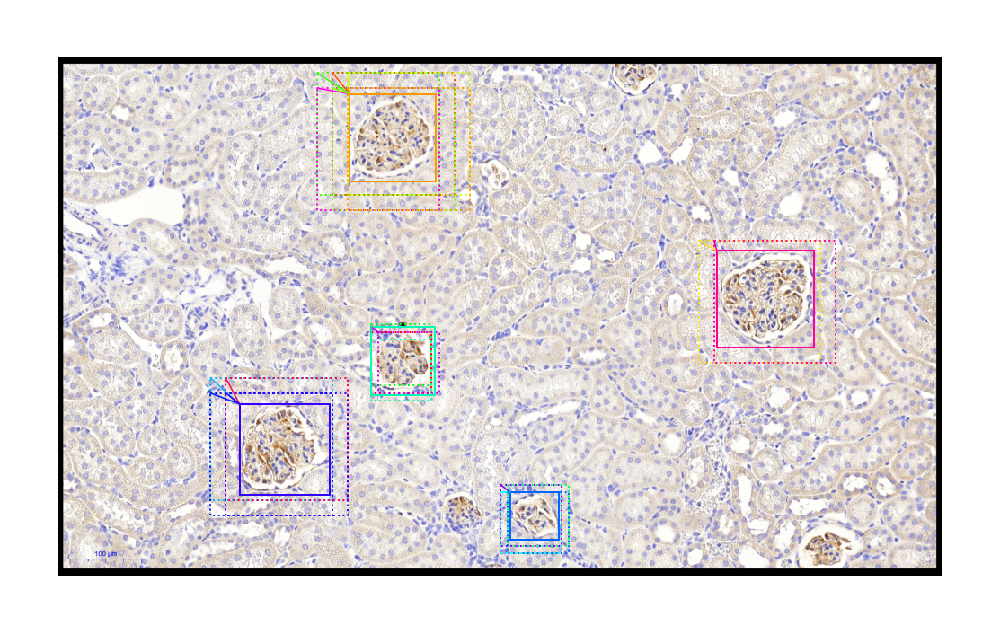

In [25]:
# Display positive anchors before refinement (dotted) and
# after refinement (solid).
visualize.draw_boxes(
    image, ax=get_ax(),
    boxes=positive_anchors,
    refined_boxes=refined_anchors)

### 1.b RPN Predictions

Here we run the RPN graph and display its predictions.

In [26]:
# Run RPN sub-graph
pillar = model.keras_model.get_layer("ROI").output  # node to start searching from

# TF 1.4 and 1.9 introduce new versions of NMS. Search for all names to support TF 1.3~1.10
nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression:0")
if nms_node is None:
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV2:0")
if nms_node is None: #TF 1.9-1.10
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV3:0")

rpn = model.run_graph(image[np.newaxis], [
    ("rpn_class", model.keras_model.get_layer("rpn_class").output),
    ("pre_nms_anchors", model.ancestor(pillar, "ROI/pre_nms_anchors:0")),
    ("refined_anchors", model.ancestor(pillar, "ROI/refined_anchors:0")),
    ("refined_anchors_clipped", model.ancestor(pillar, "ROI/refined_anchors_clipped:0")),
    ("post_nms_anchor_ix", nms_node),
    ("proposals", model.keras_model.get_layer("ROI").output),
], image_metas=image_meta[np.newaxis])

rpn_class                shape: (1, 504339, 2)        min:    0.00000  max:    1.00000  float32
pre_nms_anchors          shape: (1, 6000, 4)          min:   -0.33306  max:    1.27418  float32
refined_anchors          shape: (1, 6000, 4)          min:   -0.37891  max:    1.27411  float32
refined_anchors_clipped  shape: (1, 6000, 4)          min:    0.00000  max:    1.00000  float32
post_nms_anchor_ix       shape: (1000,)               min:    0.00000  max: 3219.00000  int32
proposals                shape: (1, 1000, 4)          min:    0.00000  max:    1.00000  float32


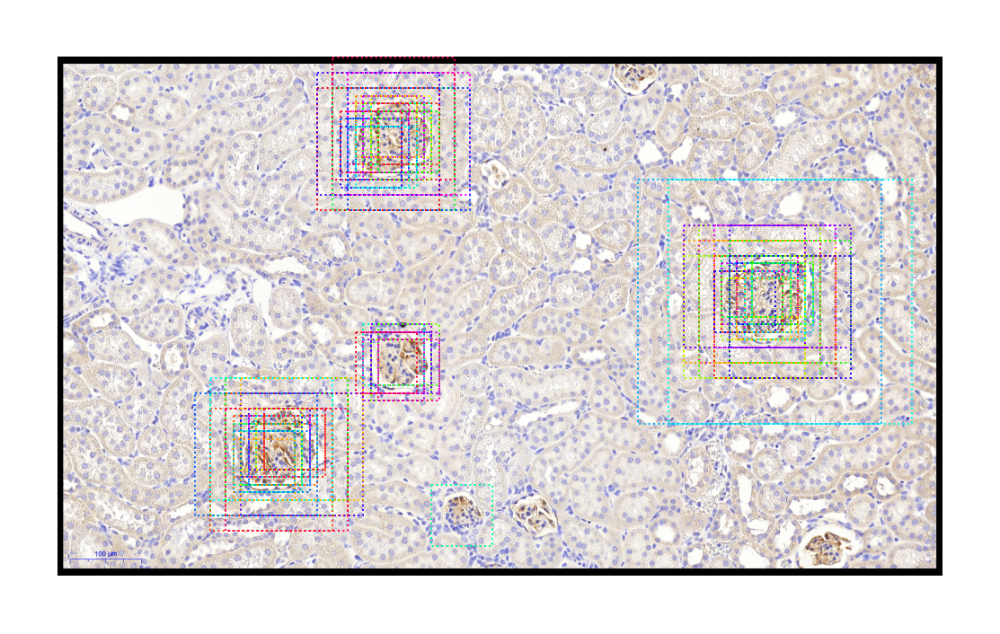

In [27]:
# Show top anchors by score (before refinement)
limit = 100
sorted_anchor_ids = np.argsort(rpn['rpn_class'][:,:,1].flatten())[::-1]
visualize.draw_boxes(image, boxes=anchors[sorted_anchor_ids[:limit]], ax=get_ax())

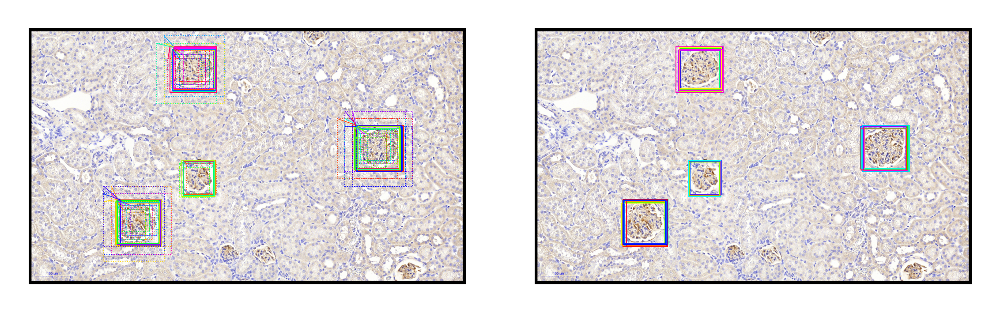

In [28]:
# Show top anchors with refinement. Then with clipping to image boundaries
limit = 50
ax = get_ax(1, 2)
pre_nms_anchors = utils.denorm_boxes(rpn["pre_nms_anchors"][0], image.shape[:2])
refined_anchors = utils.denorm_boxes(rpn["refined_anchors"][0], image.shape[:2])
refined_anchors_clipped = utils.denorm_boxes(rpn["refined_anchors_clipped"][0], image.shape[:2])
visualize.draw_boxes(image, boxes=pre_nms_anchors[:limit],
                     refined_boxes=refined_anchors[:limit], ax=ax[0])
visualize.draw_boxes(image, refined_boxes=refined_anchors_clipped[:limit], ax=ax[1])

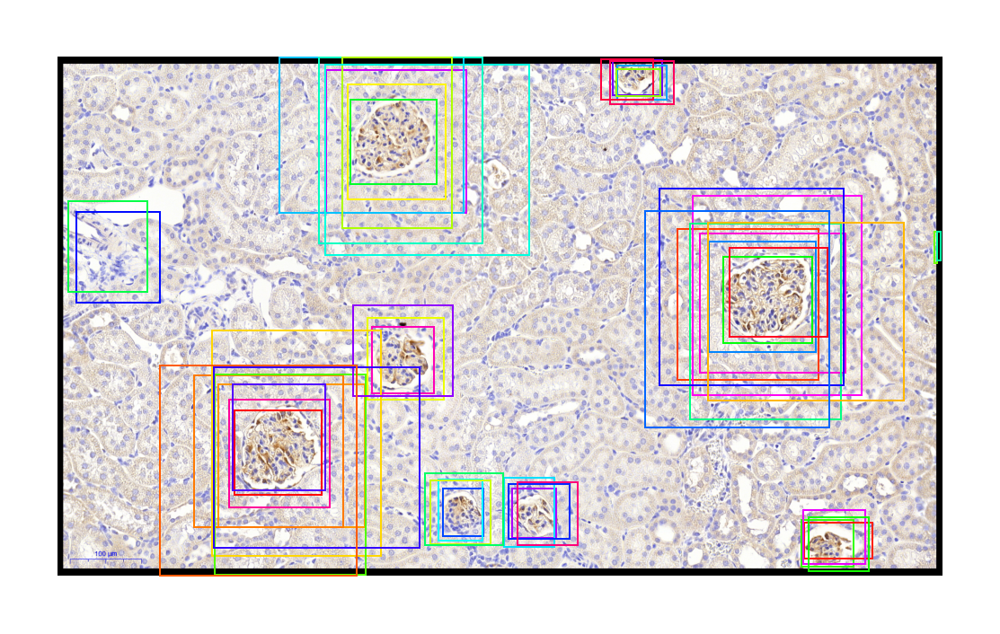

In [29]:
# Show refined anchors after non-max suppression
limit = 50
ixs = rpn["post_nms_anchor_ix"][:limit]
visualize.draw_boxes(image, refined_boxes=refined_anchors_clipped[ixs], ax=get_ax())

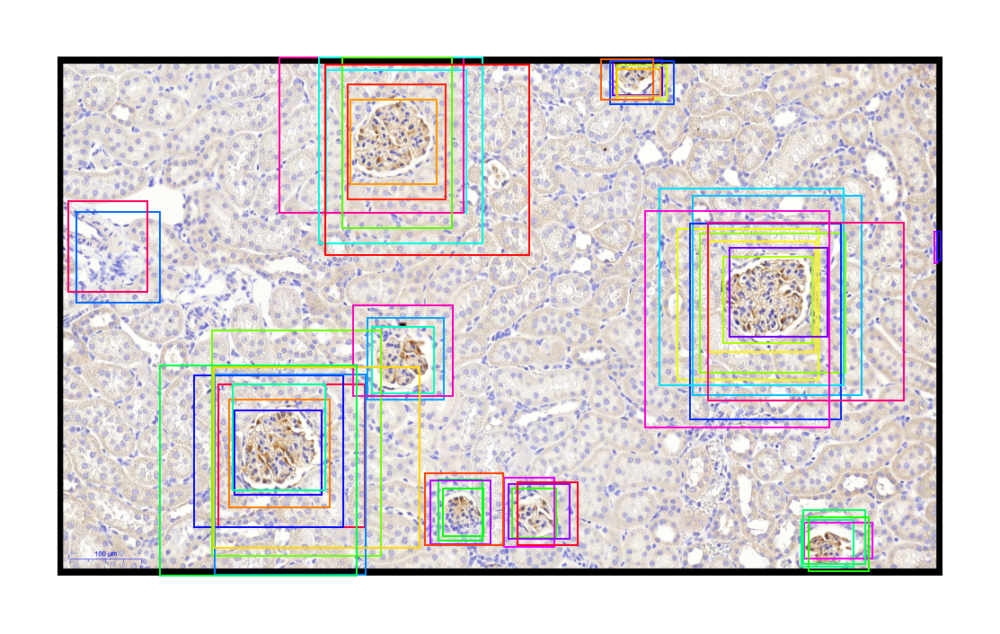

In [30]:
# Show final proposals
# These are the same as the previous step (refined anchors 
# after NMS) but with coordinates normalized to [0, 1] range.
limit = 50
# Convert back to image coordinates for display
# h, w = config.IMAGE_SHAPE[:2]
# proposals = rpn['proposals'][0, :limit] * np.array([h, w, h, w])
visualize.draw_boxes(
    image, ax=get_ax(),
    refined_boxes=utils.denorm_boxes(rpn['proposals'][0, :limit], image.shape[:2]))

## Stage 2: Proposal Classification

This stage takes the region proposals from the RPN and classifies them.

### 2.a Proposal Classification

Run the classifier heads on proposals to generate class probabilities and bounding box regressions.

In [31]:
# Get input and output to classifier and mask heads.
mrcnn = model.run_graph([image], [
    ("proposals", model.keras_model.get_layer("ROI").output),
    ("probs", model.keras_model.get_layer("mrcnn_class").output),
    ("deltas", model.keras_model.get_layer("mrcnn_bbox").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
])

proposals                shape: (1, 1000, 4)          min:    0.00000  max:    1.00000  float32
probs                    shape: (1, 1000, 2)          min:    0.00000  max:    1.00000  float32
deltas                   shape: (1, 1000, 2, 4)       min:   -3.12326  max:    3.10695  float32
masks                    shape: (1, 400, 28, 28, 2)   min:    0.00017  max:    0.99996  float32
detections               shape: (1, 400, 6)           min:    0.00000  max:    1.00000  float32


4 detections: ['glomerulus' 'glomerulus' 'glomerulus' 'glomerulus']


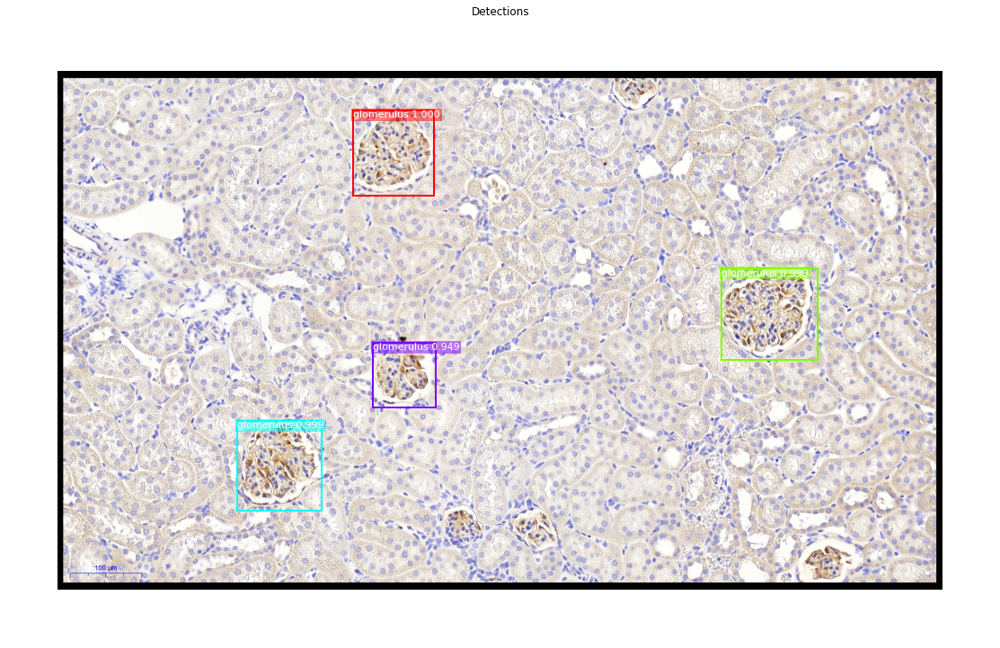

In [32]:
# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]
detections = mrcnn['detections'][0, :det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

captions = ["{} {:.3f}".format(dataset.class_names[int(c)], s) if c > 0 else ""
            for c, s in zip(detections[:, 4], detections[:, 5])]
visualize.draw_boxes(
    image, 
    refined_boxes=utils.denorm_boxes(detections[:, :4], image.shape[:2]),
    visibilities=[2] * len(detections),
    captions=captions, title="Detections",
    ax=get_ax())

### 2.c Step by Step Detection

Here we dive deeper into the process of processing the detections.

In [33]:
# Proposals are in normalized coordinates
proposals = mrcnn["proposals"][0]

# Class ID, score, and mask per proposal
roi_class_ids = np.argmax(mrcnn["probs"][0], axis=1)
roi_scores = mrcnn["probs"][0, np.arange(roi_class_ids.shape[0]), roi_class_ids]
roi_class_names = np.array(dataset.class_names)[roi_class_ids]
roi_positive_ixs = np.where(roi_class_ids > 0)[0]

# How many ROIs vs empty rows?
print("{} Valid proposals out of {}".format(np.sum(np.any(proposals, axis=1)), proposals.shape[0]))
print("{} Positive ROIs".format(len(roi_positive_ixs)))

# Class counts
print(list(zip(*np.unique(roi_class_names, return_counts=True))))

1000 Valid proposals out of 1000
22 Positive ROIs
[('BG', 978), ('glomerulus', 22)]


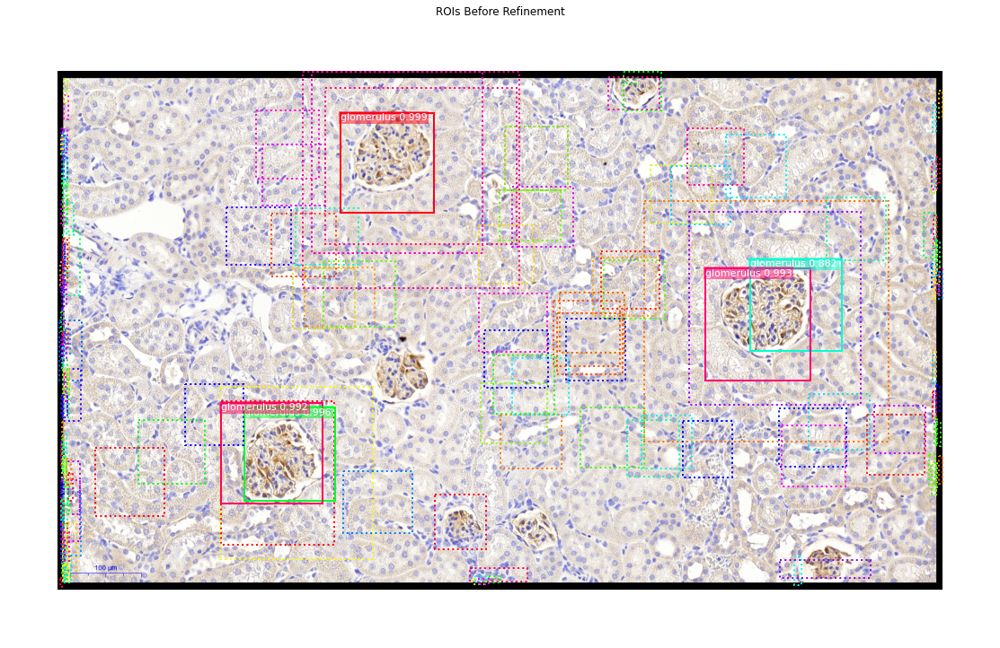

In [34]:
# Display a random sample of proposals.
# Proposals classified as background are dotted, and
# the rest show their class and confidence score.
limit = 200
ixs = np.random.randint(0, proposals.shape[0], limit)
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[ixs], roi_scores[ixs])]
visualize.draw_boxes(
    image,
    boxes=utils.denorm_boxes(proposals[ixs], image.shape[:2]),
    visibilities=np.where(roi_class_ids[ixs] > 0, 2, 1),
    captions=captions, title="ROIs Before Refinement",
    ax=get_ax())

#### Apply Bounding Box Refinement

roi_bbox_specific        shape: (1000, 4)             min:   -2.93043  max:    2.80327  float32
refined_proposals        shape: (1000, 4)             min:   -0.03563  max:    1.00752  float32


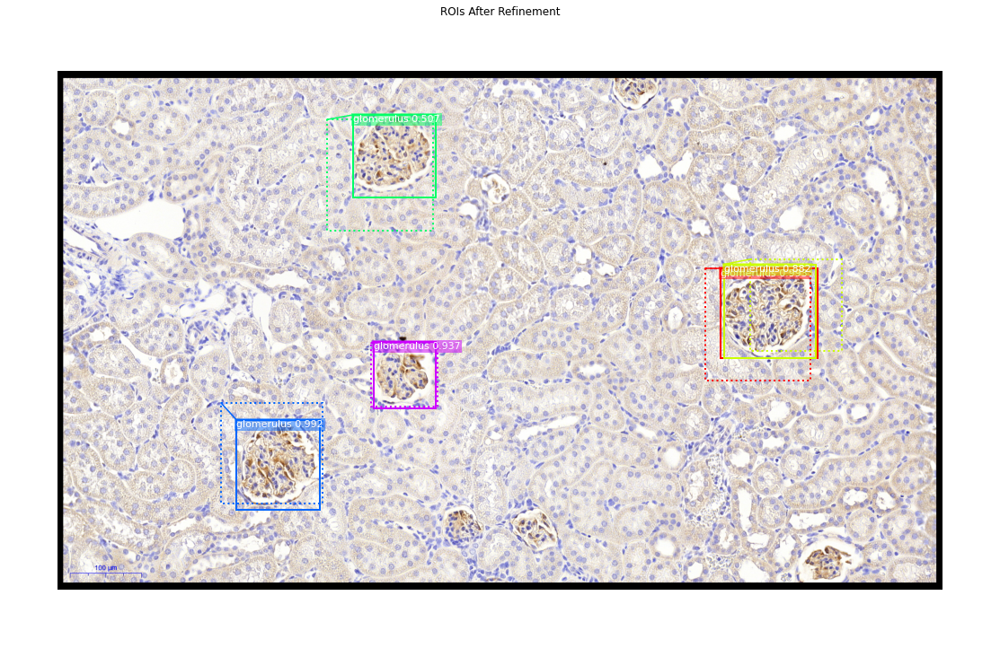

In [35]:
# Class-specific bounding box shifts.
roi_bbox_specific = mrcnn["deltas"][0, np.arange(proposals.shape[0]), roi_class_ids]
log("roi_bbox_specific", roi_bbox_specific)

# Apply bounding box transformations
# Shape: [N, (y1, x1, y2, x2)]
refined_proposals = utils.apply_box_deltas(
    proposals, roi_bbox_specific * config.BBOX_STD_DEV)
log("refined_proposals", refined_proposals)

# Show positive proposals
# ids = np.arange(roi_boxes.shape[0])  # Display all
limit = 5
ids = np.random.randint(0, len(roi_positive_ixs), limit)  # Display random sample
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[roi_positive_ixs][ids], roi_scores[roi_positive_ixs][ids])]
visualize.draw_boxes(
    image, ax=get_ax(),
    boxes=utils.denorm_boxes(proposals[roi_positive_ixs][ids], image.shape[:2]),
    refined_boxes=utils.denorm_boxes(refined_proposals[roi_positive_ixs][ids], image.shape[:2]),
    visibilities=np.where(roi_class_ids[roi_positive_ixs][ids] > 0, 1, 0),
    captions=captions, title="ROIs After Refinement")

#### Filter Low Confidence Detections

In [36]:
# Remove boxes classified as background
keep = np.where(roi_class_ids > 0)[0]
print("Keep {} detections:\n{}".format(keep.shape[0], keep))

Keep 22 detections:
[  0   1   2   3   8  14  18  21  32  42  46  49  63  89 133 356 425 445
 453 482 782 986]


In [37]:
# Remove low confidence detections
keep = np.intersect1d(keep, np.where(roi_scores >= config.DETECTION_MIN_CONFIDENCE)[0])
print("Remove boxes below {} confidence. Keep {}:\n{}".format(
    config.DETECTION_MIN_CONFIDENCE, keep.shape[0], keep))

Remove boxes below 0 confidence. Keep 22:
[  0   1   2   3   8  14  18  21  32  42  46  49  63  89 133 356 425 445
 453 482 782 986]


#### Per-Class Non-Max Suppression

In [38]:
# Apply per-class non-max suppression
pre_nms_boxes = refined_proposals[keep]
pre_nms_scores = roi_scores[keep]
pre_nms_class_ids = roi_class_ids[keep]

nms_keep = []
for class_id in np.unique(pre_nms_class_ids):
    # Pick detections of this class
    ixs = np.where(pre_nms_class_ids == class_id)[0]
    # Apply NMS
    class_keep = utils.non_max_suppression(pre_nms_boxes[ixs], 
                                            pre_nms_scores[ixs],
                                            config.DETECTION_NMS_THRESHOLD)
    # Map indicies
    class_keep = keep[ixs[class_keep]]
    nms_keep = np.union1d(nms_keep, class_keep)
    print("{:22}: {} -> {}".format(dataset.class_names[class_id][:20], 
                                   keep[ixs], class_keep))

keep = np.intersect1d(keep, nms_keep).astype(np.int32)
print("\nKept after per-class NMS: {}\n{}".format(keep.shape[0], keep))

glomerulus            : [  0   1   2   3   8  14  18  21  32  42  46  49  63  89 133 356 425 445
 453 482 782 986] -> [14  0  2  8]

Kept after per-class NMS: 4
[ 0  2  8 14]


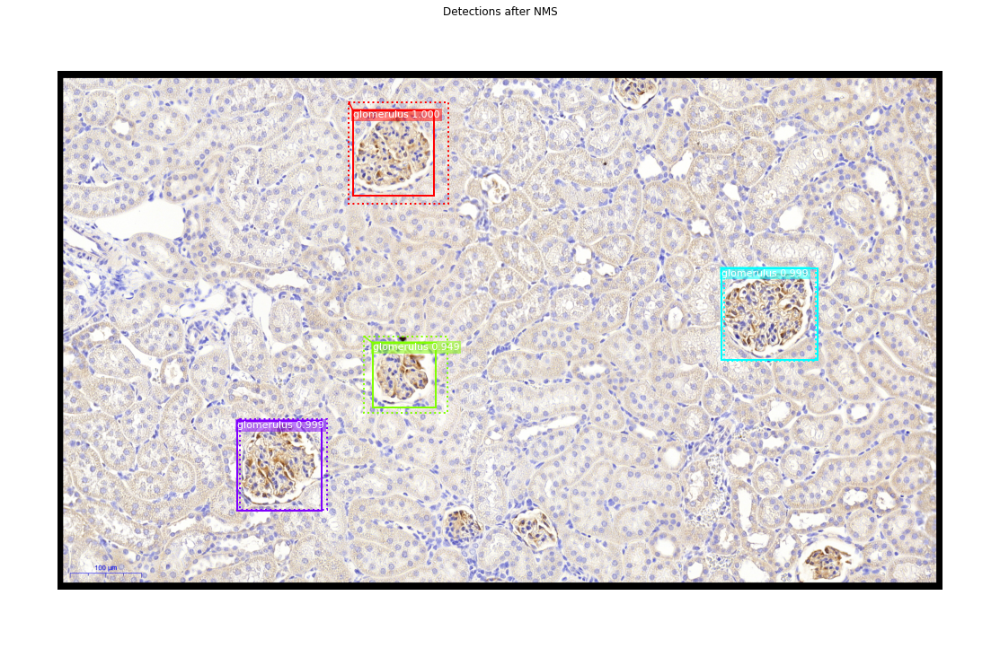

In [39]:
# Show final detections
ixs = np.arange(len(keep))  # Display all
# ixs = np.random.randint(0, len(keep), 10)  # Display random sample
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[keep][ixs], roi_scores[keep][ixs])]
visualize.draw_boxes(
    image,
    boxes=utils.denorm_boxes(proposals[keep][ixs], image.shape[:2]),
    refined_boxes=utils.denorm_boxes(refined_proposals[keep][ixs], image.shape[:2]),
    visibilities=np.where(roi_class_ids[keep][ixs] > 0, 1, 0),
    captions=captions, title="Detections after NMS",
    ax=get_ax())

## Stage 3: Generating Masks

This stage takes the detections (refined bounding boxes and class IDs) from the previous layer and runs the mask head to generate segmentation masks for every instance.

### 3.a Mask Targets

These are the training targets for the mask branch

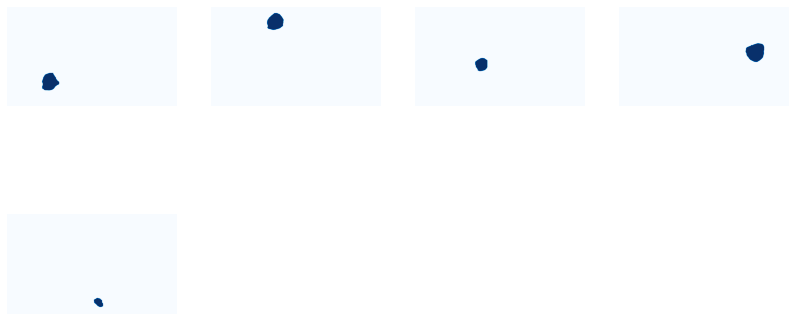

In [40]:
limit = 8
display_images(np.transpose(gt_mask[..., :limit], [2, 0, 1]), cmap="Blues")

### 3.b Predicted Masks

In [41]:
# Get predictions of mask head
mrcnn = model.run_graph([image], [
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
])

# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

detections               shape: (1, 400, 6)           min:    0.00000  max:    1.00000  float32
masks                    shape: (1, 400, 28, 28, 2)   min:    0.00017  max:    0.99996  float32
4 detections: ['glomerulus' 'glomerulus' 'glomerulus' 'glomerulus']


In [42]:
# Masks
det_boxes = utils.denorm_boxes(mrcnn["detections"][0, :, :4], image.shape[:2])
det_mask_specific = np.array([mrcnn["masks"][0, i, :, :, c] 
                              for i, c in enumerate(det_class_ids)])
det_masks = np.array([utils.unmold_mask(m, det_boxes[i], image.shape)
                      for i, m in enumerate(det_mask_specific)])
log("det_mask_specific", det_mask_specific)
log("det_masks", det_masks)

det_mask_specific        shape: (4, 28, 28)           min:    0.00017  max:    0.99996  float32
det_masks                shape: (4, 1088, 1856)       min:    0.00000  max:    1.00000  bool


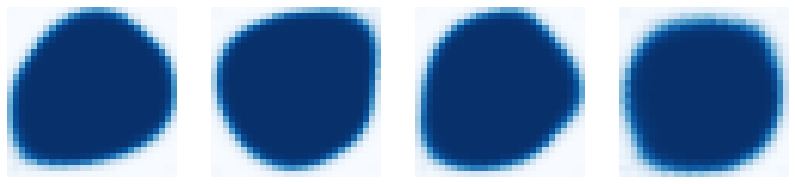

In [43]:
display_images(det_mask_specific[:4] * 255, cmap="Blues", interpolation="none")

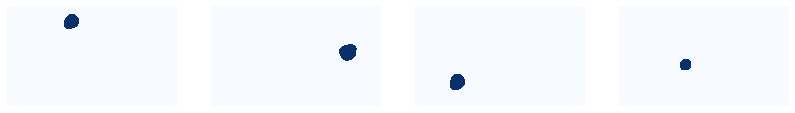

In [44]:
display_images(det_masks[:4] * 255, cmap="Blues", interpolation="none")

## Visualize Activations

In some cases it helps to look at the output from different layers and visualize them to catch issues and odd patterns.

In [45]:
# Get activations of a few sample layers
activations = model.run_graph([image], [
    ("input_image",        tf.identity(model.keras_model.get_layer("input_image").output)),
    ("res2c_out",          model.keras_model.get_layer("res2c_out").output),
    ("res3c_out",          model.keras_model.get_layer("res3c_out").output),
    ("rpn_bbox",           model.keras_model.get_layer("rpn_bbox").output),
    ("roi",                model.keras_model.get_layer("ROI").output),
])

input_image              shape: (1, 1088, 1856, 3)    min: -205.24001  max:   79.61000  float32
res2c_out                shape: (1, 272, 464, 256)    min:   -0.00000  max:   19.13526  float32
res3c_out                shape: (1, 136, 232, 512)    min:   -0.00000  max:   16.21955  float32
rpn_bbox                 shape: (1, 504339, 4)        min:  -21.52329  max:   40.25048  float32
roi                      shape: (1, 1000, 4)          min:    0.00000  max:    1.00000  float32


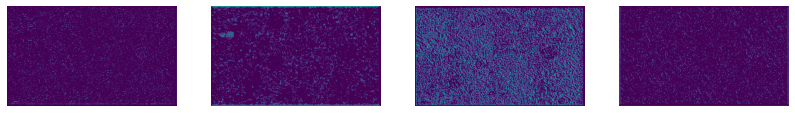

In [46]:
# Backbone feature map
display_images(np.transpose(activations["res2c_out"][0,:,:,:4], [2, 0, 1]), cols=4)